In [1]:
from random import gauss as gs
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import TimeSeriesSplit

import itertools
#from pmdarima import auto_arima

#statsmodels
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import acf, pacf, adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
# Standard scaler for preprocessing
from sklearn.preprocessing import StandardScaler

from statsmodels.graphics import tsaplots
import statsmodels.api as sm
import plotly.graph_objects as go

%matplotlib inline

# Definitions to save model results
*These definitions were adopted from [paratha19's](https://github.com/pratha19/Hourly_Energy_Consumption_Prediction) github*

In [2]:
# Creating an empty dict to save all the erros from different models
dict_error = dict()

In [3]:
# creating function for plotting predicted vs actual energy values
def plot_predvstrue_reg(pred, truth, model_name=None):
    """
    Plots the observed energy consumption against the predicted energy consumption
    """
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    ax.scatter(truth, pred) 
    _ = plt.xlabel("Observed energy in MWH")
    _ = plt.ylabel("Predicted energy in MWH")
    _ = plt.title("Observed vs Predicted energy using model {}".format(model_name))
    _ = plt.xlim(1000, 5000)
    _ = plt.ylim(1000, 5000)
    #plotting 45 deg line to see how the prediction differs from the observed values
    x = np.linspace(*ax.get_xlim())
    _ = ax.plot(x, x)

In [4]:
def error_metrics(y_pred, y_truth, model_name = None, test = True):
    """
    Printing error metrics like RMSE (root mean square error), R2 score, 
    MAE (mean absolute error), MAPE (mean absolute % error). 
    
    y_pred: predicted values of y using the model model_name
    y_truth: observed values of y
    model_name: name of the model used for predictions
    test: if validating on test set, True; otherwise False for training set validation
    
    The function will print the RMSE, R2, MAE and MAPE error metrics for the model_name and also store the results along with 
    model_name in the dictionary dict_error so that we can compare all the models at the end.
    """
    if isinstance(y_pred, np.ndarray):
        y_pred = y_pred
    else:
        y_pred = y_pred.to_numpy()
        
    if isinstance(y_truth, np.ndarray):
        y_truth = y_truth
    else:
        y_truth = y_truth.to_numpy()
        
    print('\nError metrics for model {}'.format(model_name))
    
    RMSE = np.sqrt(mean_squared_error(y_truth, y_pred))
    print("RMSE or Root mean squared error: %.2f" % RMSE)
    
    # Explained variance score: 1 is perfect prediction

    R2 = r2_score(y_truth, y_pred)
    print('Variance score: %.2f' % R2 )

    MAE = mean_absolute_error(y_truth, y_pred)
    print('Mean Absolute Error: %.2f' % MAE)

    MAPE = (np.mean(np.abs((y_truth - y_pred) / y_truth)) * 100)
    print('Mean Absolute Percentage Error: %.2f %%' % MAPE)

    # Appending the error values along with the model_name to the dict
    if test:
        train_test = 'test'
    else:
        train_test = 'train'
    
    #df = pd.DataFrame({'model': model_name, 'RMSE':RMSE, 'R2':R2, 'MAE':MAE, 'MAPE':MAPE}, index=[0])
    name_error = ['model', 'train_test', 'RMSE', 'R2', 'MAE', 'MAPE']
    value_error = [model_name, train_test, RMSE, R2, MAE, MAPE]
    list_error = list(zip(name_error, value_error))
    
    for error in list_error:
        if error[0] in dict_error:
            # append the new number to the existing array at this slot
            dict_error[error[0]].append(error[1])
        else:
            # create a new array in this slot
            dict_error[error[0]] = [error[1]]
    return(dict_error)

In [5]:
def plot_timeseries(ts, title = 'og', opacity = 1):
    """
    Plot plotly time series of any given timeseries ts
    """
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = ts.index, y = ts.values, name = "observed",
                         line_color = 'lightslategrey', opacity = opacity))

    fig.update_layout(title_text = title,
                  xaxis_rangeslider_visible = True)
    fig.show()

In [6]:
def plot_ts_pred(og_ts, pred_ts, model_name=None, og_ts_opacity = 0.5, pred_ts_opacity = 0.5):
    """
    Plot plotly time series of the original (og_ts) and predicted (pred_ts) time series values to check how our model performs.
    model_name: name of the model used for predictions
    og_ts_opacity: opacity of the original time series
    pred_ts_opacity: opacity of the predicted time series
    """
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = og_ts.index, y = np.array(og_ts.values), name = "Observed",
                         line_color = 'deepskyblue', opacity = og_ts_opacity))

    try:
        fig.add_trace(go.Scatter(x = pred_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))
    except: #if predicted values are a numpy array they won't have an index
        fig.add_trace(go.Scatter(x = og_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))


    #fig.add_trace(go)
    fig.update_layout(title_text = 'Observed test set vs predicted energy MWH values using {}'.format(model_name),
                  xaxis_rangeslider_visible = True)
    fig.show()

In [7]:
def train_test(data, test_size = 0.15, scale = False, cols_to_transform=None, include_test_scale=False):
    """
    
        Perform train-test split with respect to time series structure
        
        - df: dataframe with variables X_n to train on and the dependent output y which is the column 'SDGE' in this notebook
        - test_size: size of test set
        - scale: if True, then the columns in the -'cols_to_transform'- list will be scaled using StandardScaler
        - include_test_scale: If True, the StandardScaler fits the data on the training as well as the test set; if False, then
          the StandardScaler fits only on the training set.
        
    """
    df = data.copy()
    # get the index after which test set starts
    test_index = int(len(df)*(1-test_size))
    
    # StandardScaler fit on the entire dataset
    if scale and include_test_scale:
        scaler = StandardScaler()
        df[cols_to_transform] = scaler.fit_transform(df[cols_to_transform])
        
    X_train = df.drop('SDGE', axis = 1).iloc[:test_index]
    y_train = df.SDGE.iloc[:test_index]
    X_test = df.drop('SDGE', axis = 1).iloc[test_index:]
    y_test = df.SDGE.iloc[test_index:]
    
    # StandardScaler fit only on the training set
    if scale and not include_test_scale:
        scaler = StandardScaler()
        X_train[cols_to_transform] = scaler.fit_transform(X_train[cols_to_transform])
        X_test[cols_to_transform] = scaler.transform(X_test[cols_to_transform])
    
    return X_train, X_test, y_train, y_test

# Loading Data

In [8]:
SDGE_TW = pd.read_csv('SDGE_W.csv')

In [9]:
# Dropping unnecessary columns and setting date as index
SDGE_TW = SDGE_TW.drop('Unnamed: 0', axis=1)
SDGE_TW.set_index("Date", inplace =True)
SDGE_TW.index = pd.to_datetime(SDGE_TW.index)

In [10]:
SDGE_TW.head()

,SDGE,year,month,day,hour,weekday,season,holiday,HourlyDryBulbTemperature,HourlyRelativeHumidity,HourlyWindSpeed
Date,,,,,,,,,,,
2019-01-01 00:00:00,2372.497411,2019,1,1,0,Tuesday,winter,1,49.0,71.0,0.0
2019-01-01 01:00:00,2698.751137,2019,1,1,1,Tuesday,winter,0,47.0,77.0,5.0
2019-01-01 02:00:00,2777.672120,2019,1,1,2,Tuesday,winter,0,47.0,63.0,6.0
2019-01-01 03:00:00,2799.193829,2019,1,1,3,Tuesday,winter,0,47.0,52.0,6.0
2019-01-01 04:00:00,2761.883322,2019,1,1,4,Tuesday,winter,0,46.5,51.5,5.5


In [11]:
# creating categorical columns for linear regression 
cat_cols = ['year', 'month', 'day', 'hour', 'weekday', 'season', 'holiday']

for col in cat_cols:
    SDGE_TW[col] = SDGE_TW[col].astype('category')

In [12]:
# Preparing dummy columns for use in sklearn's linear regression 
SDGE_TW_Lin = pd.get_dummies(SDGE_TW, drop_first = True)

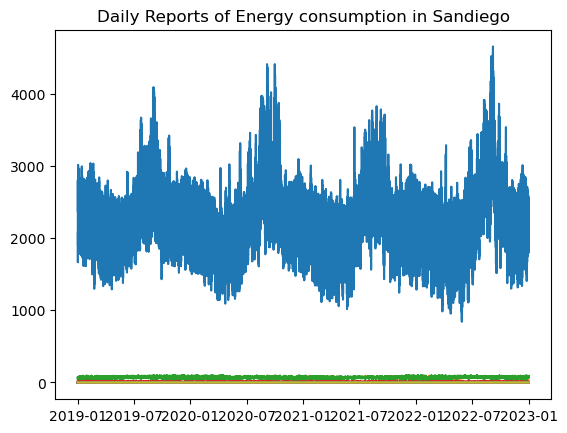

In [13]:
fig, ax = plt.subplots()
ax.plot(SDGE_TW_Lin)
ax.set_title("Daily Reports of Energy consumption in Sandiego");

# Pre Processing

In [14]:
# Creating a simple time series dataframe
th_sdge = pd.DataFrame(SDGE_TW["SDGE"], columns=['SDGE'])

In [15]:
th_sdge.head()

,SDGE
Date,
2019-01-01 00:00:00,2372.497411
2019-01-01 01:00:00,2698.751137
2019-01-01 02:00:00,2777.672120
2019-01-01 03:00:00,2799.193829
2019-01-01 04:00:00,2761.883322


Date
2019-01-01 00:00:00     43.285239
2019-01-01 01:00:00    149.527611
2019-01-01 02:00:00    330.518297
2019-01-01 03:00:00    351.247265
2019-01-01 04:00:00    407.755806
Name: seasonal, dtype: float64


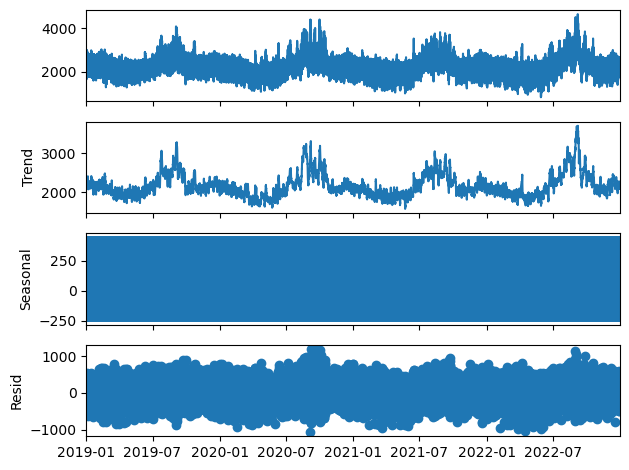

In [16]:
decomp = sm.tsa.seasonal_decompose(th_sdge)  
# Print the first few values of the seasonal component 
print(decomp.seasonal.head())  
# Plot the decomposition 
_ = decomp.plot() 

In [17]:
th_sdge['seasonal'] = decomp.seasonal

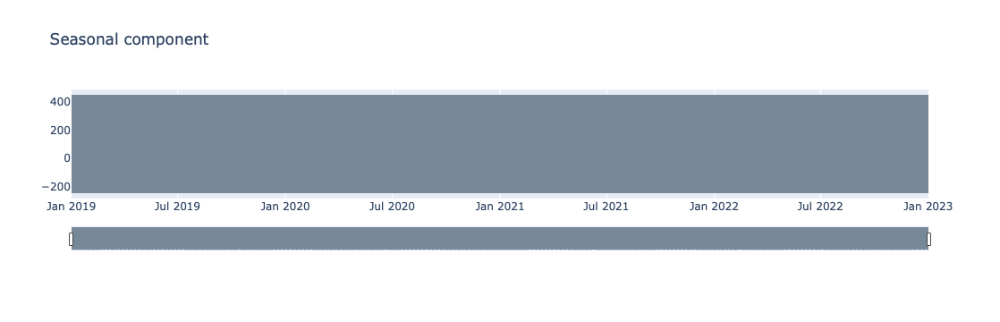

In [18]:
# Plotting the seasonal coponent only
plot_timeseries(th_sdge['seasonal'], title = 'Seasonal component')

In [19]:
th_sdge['trend'] = decomp.trend

<Axes: xlabel='Date'>

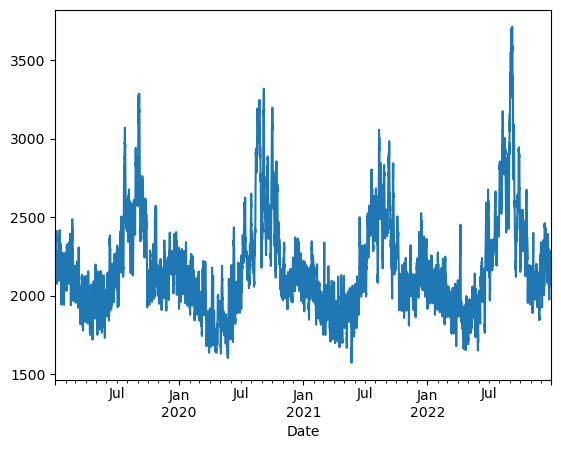

In [20]:
# Plotting the trend 
th_sdge['trend'].dropna().plot()

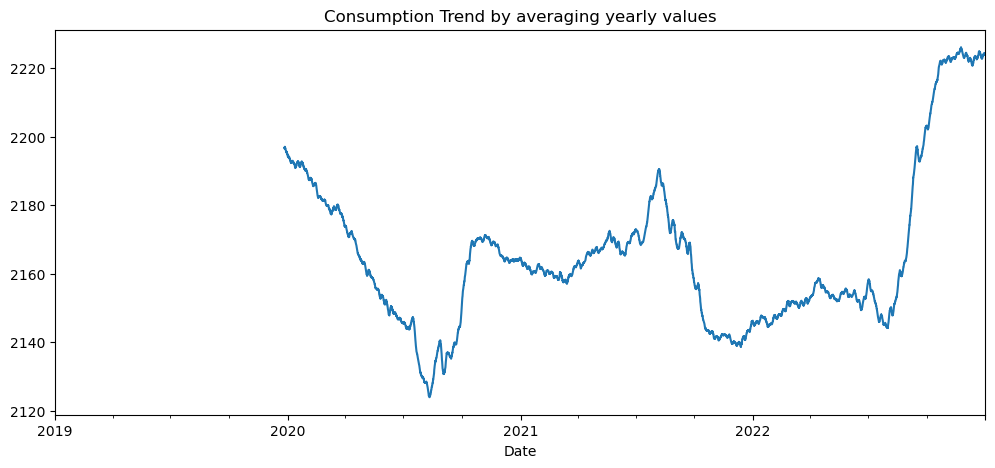

In [21]:
# Plotting the half yearly rolling average of the time series to check trend (mean consumption)

_ = SDGE_TW['SDGE'].rolling(window = 24*30*12).mean().plot(figsize=(12,5))
_ = plt.title('Consumption Trend by averaging yearly values')

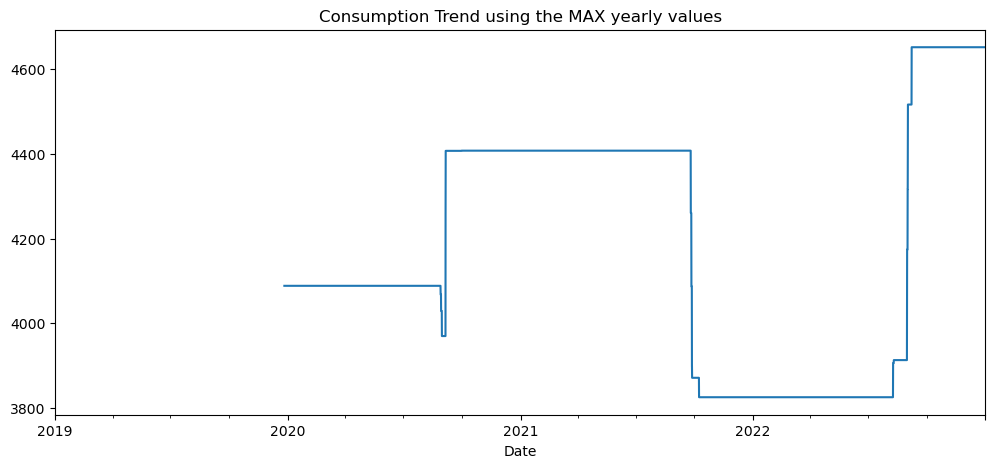

In [22]:
# Plotting the quartely rolling MAX of the time series to check trend
_ = SDGE_TW['SDGE'].rolling(window = 24*30*12).max().plot(figsize=(12,5))
_ = plt.title('Consumption Trend using the MAX yearly values')

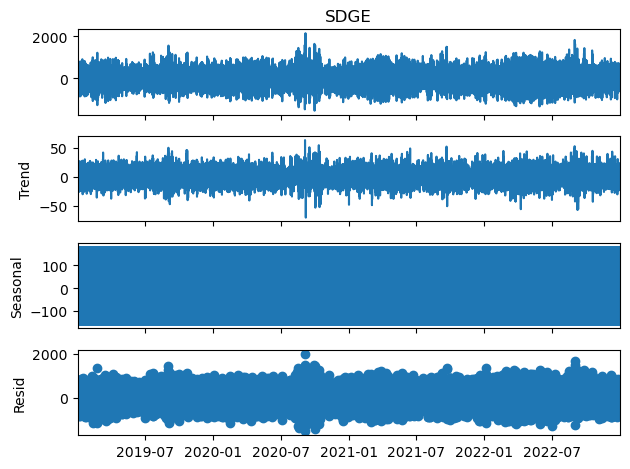

In [23]:
# Differencing the data once

decomp_diff1 = sm.tsa.seasonal_decompose(th_sdge['SDGE'].diff().dropna()) 
_ = decomp_diff1.plot()

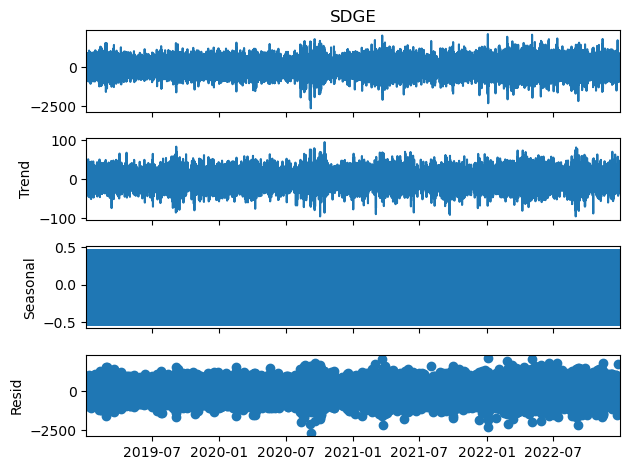

In [24]:
# Differencing the data with periodicity of 24 hours in addition to the original single differencing

decomp_diff24 = sm.tsa.seasonal_decompose(th_sdge['SDGE'].diff().dropna().diff(24).dropna()) 
_ = decomp_diff24.plot()

# Testing for stationarity 
Based on the provided information, the test statistic is -8.697959e+00 and the p-value is 3.878533e-14. 
If the p-value is less than the significance level (commonly 0.05), we reject the null hypothesis 
and conclude that the time series is stationary. 

In this case, the p-value (3.878533e-14) is much smaller than the significance level (0.05), 
indicating strong evidence against the null hypothesis. We can therefore conclude that the time series is stationary.

In [25]:
ts_sdge = pd.DataFrame(SDGE_TW["SDGE"], columns=['SDGE'])

In [26]:
ts_test = adfuller(ts_sdge)
display(ts_test)

(-8.69795881318699,
 3.878533167943309e-14,
 52,
 35011,
 {'1%': -3.43053679213716,
  '5%': -2.8616225575095284,
  '10%': -2.566813942767471},
 475245.4656370086)

In [27]:
# Extract and display test results in a user friendly manner
dfoutput = pd.Series(
                ts_test[0:4], 
                index=['Test Statistic','p-value','#Lags Used','Number of Observations Used']
)

for key,value in ts_test[4].items():
    dfoutput['Critical Value (%s)'%key] = value
    
display(dfoutput)

Test Statistic                -8.697959e+00
p-value                        3.878533e-14
#Lags Used                     5.200000e+01
Number of Observations Used    3.501100e+04
Critical Value (1%)           -3.430537e+00
Critical Value (5%)           -2.861623e+00
Critical Value (10%)          -2.566814e+00
dtype: float64

# Exponential Smoothing

In [28]:
# Defining a function to plot exponentially smoothed data
def plot_ewma(ts, alpha):
    expw_ma = ts.ewm(alpha=alpha).mean()
    
    plot_ts_pred(ts, expw_ma, model_name='Exponentially smoothed data with alpha = {}'.format(alpha), \
                 og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

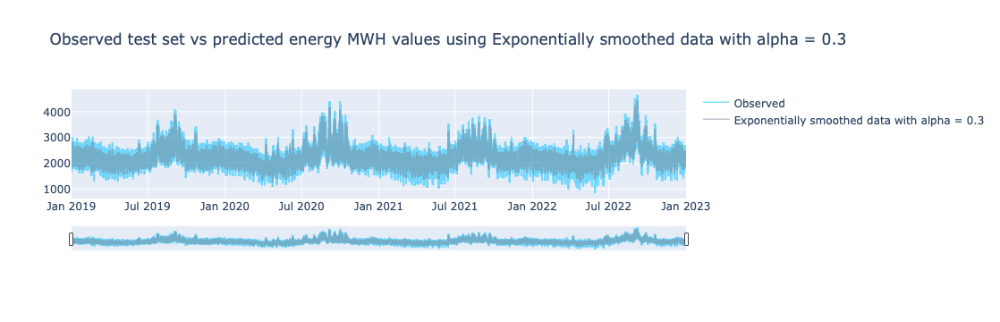

In [29]:
# Plotting the exponentially smoothed energy consumption data with alpha=0.3
plot_ewma(ts_sdge['SDGE'], 0.3)

# Autocorrelation

In [30]:
def acf_pacf_plots(ts, lags, figsize = (12,8)):
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize = figsize)
    
    # Plot the ACF of ts
    _ = plot_acf(ts, lags = lags, zero = False, ax = ax1, alpha = 0.05)

    # Plot the PACF of ts
    _ = plot_pacf(ts, lags = lags, zero = False, ax = ax2, alpha = 0.05)

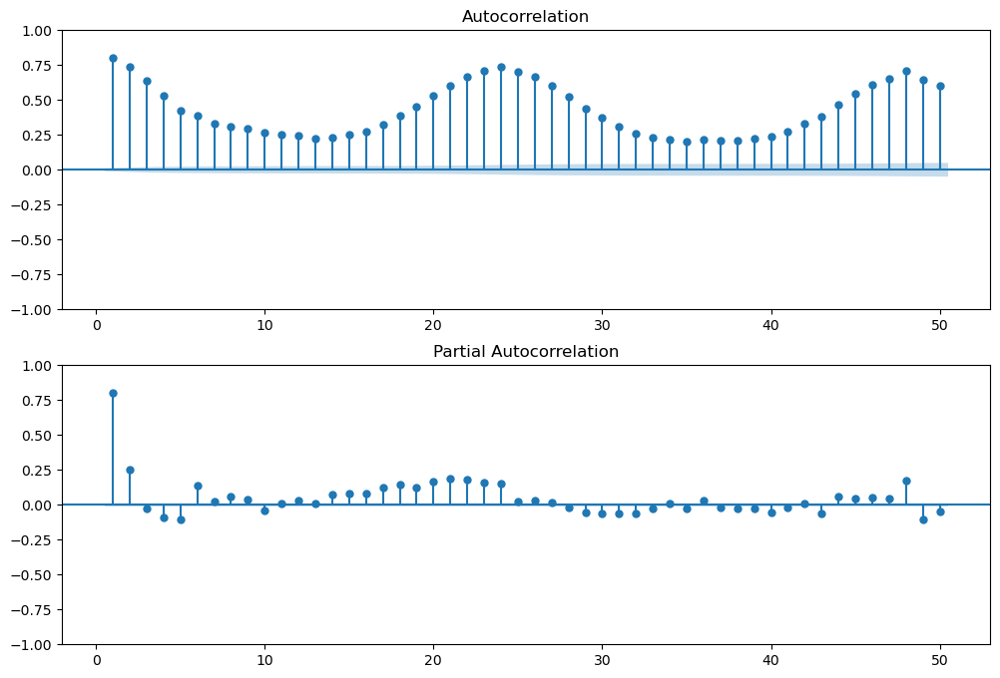

In [31]:
# Create the acf and pacf plots

dfacf = []
dfacf = ts_sdge['SDGE']
lags = 50

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))

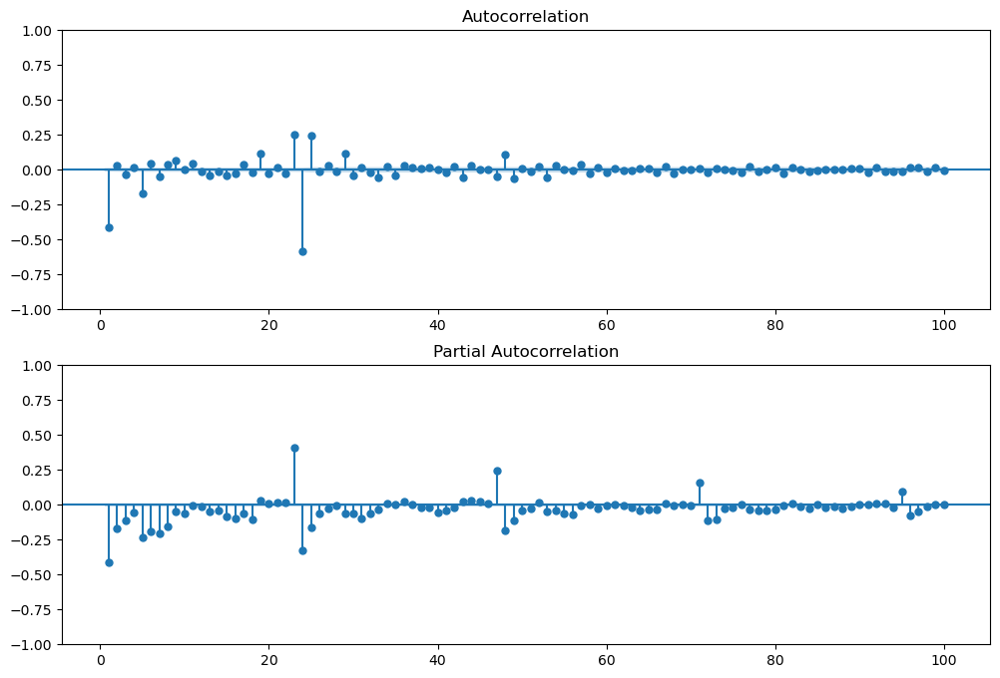

In [32]:
# Differencing the data this time to remove the trend and seasonality
dfacf = []
dfacf = ts_sdge['SDGE']
dfacf = dfacf.diff().dropna() 
dfacf = dfacf.diff(24).dropna()
dfacf = dfacf.diff(24*365).dropna()
lags = 100

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))

In [33]:
split = TimeSeriesSplit()

for train_ind, val_ind in split.split(train):
    print(train_ind, val_ind)

NameError: name 'train' is not defined

# Baseline Model
## Persistant Forcast
Using the RMSE metric the average magnitude of the errors between the predicted values and the actual values. The output of 420.73 indicates that, on average, the predictions from the naive forecast model have an error of approximately 420.73 MW units when compared to the actual values in the train dataset.

Will be opting to reduce the error between predicted and and actual values using this naive model as a baseline

In [36]:
# Creating the train and test data
# A test_size og 0.15 gives us a training set of 4 years and 3 months and a test set of 9 months (the test set includes 
#...winter and summer seasons.

cols_to_transform = ['HourlyDryBulbTemperature'] # other columns are binary values
X_train, X_test, y_train, y_test = train_test(SDGE_TW_Lin, test_size = 0.15, scale = True, cols_to_transform=cols_to_transform)

In [37]:
# Calculating the errors for persistent forecast (where we simply repeat the values from last year)
#y_test.index.year
_ = error_metrics(SDGE_TW_Lin.loc[X_test.index.shift(-8760, freq='H'), 'SDGE'], 
                  y_test, model_name='Baseline Persistent forecast, repeat last year', test=True)


Error metrics for model Baseline Persistent forecast, repeat last year
RMSE or Root mean squared error: 420.73
Variance score: 0.30
Mean Absolute Error: 304.72
Mean Absolute Percentage Error: 12.49 %


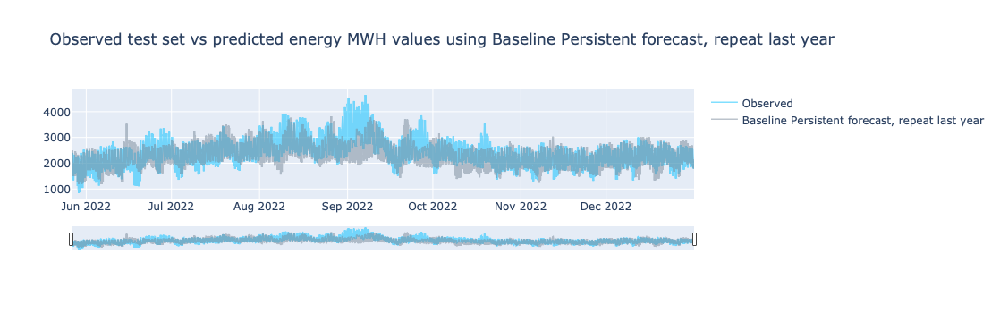

In [38]:
plot_ts_pred(y_test, SDGE_TW_Lin.loc[X_test.index.shift(-8760, freq='H'), 'SDGE'].to_numpy(),
             model_name='Baseline Persistent forecast, repeat last year')

In [40]:
# In the energy forecasting domain, it is even more important to get the daily max demand right
# Calculating Daily max error
# Resampling both the y_test and predictions at a 24 hours period and using the max as the aggregate function
_ = error_metrics(SDGE_TW_Lin.loc[X_test.index.shift(-8760, freq='H'), 'SDGE'].resample('24h').max(), 
                  y_test.resample('24h').max(), 
                  model_name='Baseline Persistent forecast, repeat last year; daily MAX', test=True)


Error metrics for model Baseline Persistent forecast, repeat last year; daily MAX
RMSE or Root mean squared error: 410.95
Variance score: 0.26
Mean Absolute Error: 275.01
Mean Absolute Percentage Error: 8.53 %


In [42]:
print('error on hour ahead persistent forecast')
_ = error_metrics(SDGE_TW_Lin.loc[X_test.index.shift(-1, freq='H'), 'SDGE'], 
                  y_test, model_name='Baseline Persistent forecast, repeat last hour', test=True)

error on hour ahead persistent forecast

Error metrics for model Baseline Persistent forecast, repeat last hour
RMSE or Root mean squared error: 296.49
Variance score: 0.65
Mean Absolute Error: 210.37
Mean Absolute Percentage Error: 9.30 %


# Lag Variables

In [46]:
# Adding max 24 lags; lag1 is the value of the energy consumption in the previous hour, lag2 is the value of energy consumption..
#..2 hours before the current value and so on.

# Creating the lag variables
for i in range(24):
    SDGE_TW_Lin['lag'+str(i+1)] = SDGE_TW_Lin['SDGE'].shift(i+1)

In [47]:
# Since the first 24 values won't have any 24th lag, they will be NaN. So dropping the NaNs
SDGE_TW_Lin = SDGE_TW_Lin.dropna()

In [48]:
SDGE_TW_Lin.head()

,SDGE,HourlyDryBulbTemperature,HourlyRelativeHumidity,HourlyWindSpeed,year_2020,year_2021,year_2022,month_2,month_3,month_4,...,lag15,lag16,lag17,lag18,lag19,lag20,lag21,lag22,lag23,lag24
Date,,,,,,,,,,,,,,,,,,,,,
2019-01-02 00:00:00,2485.555484,49.0,21.0,6.0,False,False,False,False,False,False,...,1670.220977,1663.962110,1707.867671,1955.860120,2300.870096,2761.883322,2799.193829,2777.672120,2698.751137,2372.497411
2019-01-02 01:00:00,2721.290944,46.0,26.0,0.0,False,False,False,False,False,False,...,1736.026764,1670.220977,1663.962110,1707.867671,1955.860120,2300.870096,2761.883322,2799.193829,2777.672120,2698.751137
2019-01-02 02:00:00,2892.607242,46.0,27.0,0.0,False,False,False,False,False,False,...,1779.382840,1736.026764,1670.220977,1663.962110,1707.867671,1955.860120,2300.870096,2761.883322,2799.193829,2777.672120
2019-01-02 03:00:00,2959.789468,43.0,35.0,7.0,False,False,False,False,False,False,...,1937.755534,1779.382840,1736.026764,1670.220977,1663.962110,1707.867671,1955.860120,2300.870096,2761.883322,2799.193829
2019-01-02 04:00:00,3012.999287,42.5,36.5,3.5,False,False,False,False,False,False,...,1858.500053,1937.755534,1779.382840,1736.026764,1670.220977,1663.962110,1707.867671,1955.860120,2300.870096,2761.883322


# Multiple Seasonality

In [109]:
# We can add multiple fourer series with different k terms in the (2*k*pi) such as k=1,2,3...etc. To generalize the problem, 
# we could have chosen an optimal k value for each season by trying out some k values and choosing the values giving 
#the lowest AIC.

def add_fourier_terms(df, year_k, week_k, day_k):
    """
    df: dataframe to add the fourier terms to 
    year_k: the number of Fourier terms the year period should have. Thus the model will be fit on 2*year_k terms (1 term for 
    sine and 1 for cosine)
    week_k: same as year_k but for weekly periods
    day_k:same as year_k but for daily periods
    """
    
    for k in range(1, year_k+1):
        # year has a period of 365.25 including the leap year
        df['year_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.dayofyear/365.25) 
        df['year_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.dayofyear/365.25)

    for k in range(1, week_k+1):
        
        # week has a period of 7
        df['week_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.dayofweek/7)
        df['week_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.dayofweek/7)


    for k in range(1, day_k+1):
        
        # day has period of 24
        df['hour_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.hour/24)
        df['hour_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.hour/24) 

In [110]:
# as said above the k terms for each yearly, weekly and daily seasonalities could be chosen by optimizing on the AIC values..
# but after some research on energy consumption time series k= 5 was chosen for each seasonality
add_fourier_terms(lag_sdge, year_k= 5, week_k=5 , day_k=5)

NameError: name 'lag_sdge' is not defined